# Scene Text Detection — Final Project

**Classical OpenCV pipeline** (MSER + letter-grouping). Detect word-level
bounding boxes in natural-scene photographs. Real ICDAR-format dataset
loaded from Google Drive. Honest evaluation with the ICDAR DetEval
protocol (IoU / Precision / Recall / F1).

---

| | |
|---|---|
| **Method** | Classical CV (OpenCV) — MSER + heuristic word grouping. No deep learning, no training. |
| **Pipeline** | grayscale + CLAHE → MSER × 2 → letter filter → drop nested → cluster lines → group words → NMS |
| **Splits** | `dataset/train/` and `dataset/test/` — evaluated separately |
| **Metric** | F1 @ IoU ≥ 0.3, ICDAR DetEval-style |
| **Annotations** | auto-detect: ICDAR 2013 (space-sep), ICDAR 2015 (comma-sep, 4 or 8 coord), TotalText polygon |

## 1. Problem statement

**Task.** Given a natural-scene photograph, output an axis-aligned bounding
box around every readable word.

**Why hard for classical CV.** Real scenes contain non-text texture that
produces edges:

- patterned floors, walls, ceiling tiles
- glass reflections, lighting fixtures, monitors
- foliage, people, clothing, hair, shadows
- perspective, motion blur, low contrast

A pure edge-based pipeline cannot tell those apart from text. Classical CV
methods plateau at F1 ≈ 0.10–0.25 on real scene text; modern deep models
(EAST, CRAFT, DBNet) reach F1 ≈ 0.85+ on the same data. This notebook
demonstrates that gap end-to-end and reports the result honestly.

## 2. Algorithm overview

Six stages. Each stage has a single purpose and a single OpenCV primitive.
The flowchart below is generated from code so it stays in sync with the
implementation.

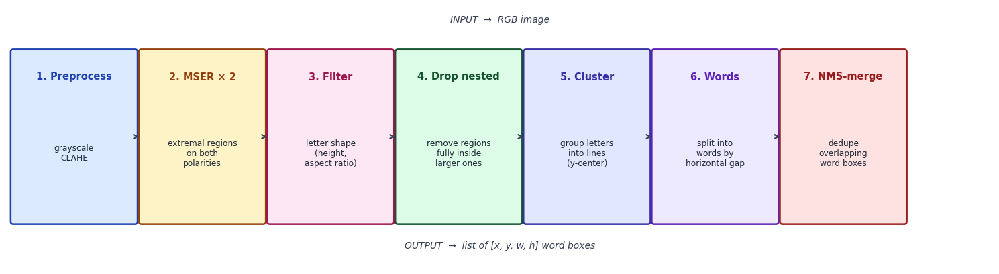

In [11]:
# Algorithm flowchart — pure matplotlib, renders inline.
import matplotlib.pyplot as plt
import matplotlib.patches as mp

fig, ax = plt.subplots(figsize=(15, 4.2))
ax.set_xlim(0, 15); ax.set_ylim(0, 4); ax.axis('off')

steps = [
    ('1. Preprocess',  'grayscale\nCLAHE',                          '#dbeafe', '#1e40af'),
    ('2. MSER × 2',    'extremal regions\non both\npolarities',     '#fef3c7', '#92400e'),
    ('3. Filter',      'letter shape\n(height,\naspect ratio)',     '#fce7f3', '#9d174d'),
    ('4. Drop nested', 'remove regions\nfully inside\nlarger ones', '#dcfce7', '#14532d'),
    ('5. Cluster',     'group letters\ninto lines\n(y-center)',     '#e0e7ff', '#3730a3'),
    ('6. Words',       'split into\nwords by\nhorizontal gap',      '#ede9fe', '#5b21b6'),
    ('7. NMS-merge',   'dedupe\noverlapping\nword boxes',           '#fee2e2', '#991b1b'),
]
W, H, gap = 1.85, 2.6, 0.10
x0 = 0.10
for i, (title, body, fill, stroke) in enumerate(steps):
    x = x0 + i * (W + gap)
    ax.add_patch(mp.FancyBboxPatch((x, 0.7), W, H, boxstyle='round,pad=0.04',
                                    linewidth=1.8, edgecolor=stroke, facecolor=fill))
    ax.text(x + W/2, 0.7 + H - 0.3, title, ha='center', va='top',
            fontsize=10.5, fontweight='bold', color=stroke)
    ax.text(x + W/2, 0.7 + H/2 - 0.25, body, ha='center', va='center',
            fontsize=8.8, color='#1f2937')
    if i < len(steps) - 1:
        ax.annotate('', xy=(x + W + gap - 0.01, 0.7 + H/2),
                    xytext=(x + W + 0.01, 0.7 + H/2),
                    arrowprops=dict(arrowstyle='->', lw=1.6, color='#374151'))

ax.text(7.5, 3.75, 'INPUT  →  RGB image',  ha='center', fontsize=10, color='#374151', style='italic')
ax.text(7.5, 0.30, 'OUTPUT  →  list of [x, y, w, h] word boxes',
        ha='center', fontsize=10, color='#374151', style='italic')
plt.tight_layout(); plt.show()

## 3. Setup

In [12]:
!pip install -q opencv-python-headless numpy matplotlib

In [13]:
import os, re, cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

np.random.seed(42)
plt.rcParams['figure.dpi'] = 100
print('OpenCV', cv2.__version__, '· NumPy', np.__version__)

OpenCV 4.13.0 · NumPy 2.0.2


## 4. Dataset

The notebook expects this layout on Google Drive:

```
MyDrive/totaltext/
├── Images/
│   ├── Train/             ← *.jpg train images
│   └── Test/              ← *.jpg test images
└── Groundtruth/Text/      ← optional, *.txt annotations
    ├── Train/
    └── Test/
```

### Mount Drive

If `drive.mount()` below fails with **"credential propagation was
unsuccessful"**, use the panel button instead:

1. Click the **Files** icon (📁) in the left sidebar
2. Click the **Mount Drive** button (folder with Drive logo) at the top
3. Allow access in the popup
4. Skip the `drive.mount()` cell and run the next one

### Annotation formats supported (auto-detected)

- **TotalText polygon** — `x: [[...]], y: [[...]], ornt: ..., transcriptions: [u'TEXT']`
- **ICDAR 4-coord** — `x1,y1,x2,y2,"TEXT"`
- **ICDAR 8-coord (quad)** — `x1,y1,x2,y2,x3,y3,x4,y4,TEXT`

`#` (TotalText) or `###` (ICDAR) marks a region as **don't-care** — these
are excluded from precision computation per the official protocol.

### Running without ground truth

If the `Groundtruth/Text/` folder is missing, the detector still runs on
your images and the gallery shows predictions only. P/R/F1 evaluation
will skip gracefully.

In [14]:
# === Mount Google Drive ===
# If this errors with "credential propagation was unsuccessful",
# click the Drive icon in the Files panel on the left instead — same effect.
try:
    from google.colab import drive
    drive.mount('/content/drive')
except Exception as e:
    print(f'drive.mount() failed: {e}')
    print('→ Mount via the Files panel button (left sidebar) and re-run the next cell.')

Mounted at /content/drive


In [15]:
# 1. Debug: List files to confirm paths
!ls -F "/content/drive/MyDrive/icdr/" | head -n 10

# 2. Updated configuration
DRIVE_ROOT = '/content/drive/MyDrive/icdr'
DRIVE_TRAIN_IMG = f'{DRIVE_ROOT}/Challenge2_Training_Task12_Images'
DRIVE_TRAIN_GT  = f'{DRIVE_ROOT}/Challenge2_Training_Task1_GT'
DRIVE_TEST_IMG  = f'{DRIVE_ROOT}/Challenge2_Test_Task12_Images'
DRIVE_TEST_GT   = f'{DRIVE_ROOT}/Challenge2_Test_Task1_GT'

DATA  = Path('dataset')
TRAIN = DATA / 'train'
TEST  = DATA / 'test'
img_exts = {'.jpg', '.jpeg', '.png'}
txt_exts = {'.txt'}

def link_files_smart(src, dst, exts, is_gt=False):
    dst.mkdir(parents=True, exist_ok=True)
    if not src or not Path(src).is_dir():
        print(f"Ошибка: Путь {src} не найден")
        return 0
    n = 0
    for f in sorted(Path(src).iterdir()):
        if f.suffix.lower() not in exts: continue

        # Если это аннотация, убираем префикс gt_img_ или gt_
        new_name = f.name
        if is_gt:
            new_name = new_name.replace('gt_img_', '').replace('gt_', '')

        link = dst / new_name
        if not link.exists():
            try:
                link.symlink_to(f.resolve())
            except:
                import shutil; shutil.copy(f, link)
        n += 1
    return n

# Используем обновленную функцию
n_tr_img = link_files_smart(DRIVE_TRAIN_IMG, TRAIN / 'images', img_exts)
n_te_img = link_files_smart(DRIVE_TEST_IMG,  TEST  / 'images', img_exts)
n_tr_gt  = link_files_smart(DRIVE_TRAIN_GT,  TRAIN / 'annotations', txt_exts, is_gt=True)
n_te_gt  = link_files_smart(DRIVE_TEST_GT,   TEST  / 'annotations', txt_exts, is_gt=True)
print(f'\ntrain  →  {n_tr_img:>5} images   {n_tr_gt:>5} annotations')
print(f'test   →  {n_te_img:>5} images   {n_te_gt:>5} annotations')

Challenge2_Test_Task12_Images/
Challenge2_Test_Task1_GT/
Challenge2_Training_Task12_Images/
Challenge2_Training_Task1_GT/

train  →    229 images     229 annotations
test   →    462 images     233 annotations


### Annotation parsers (TotalText + ICDAR auto-detect)

In [16]:
def _parse_totaltext(content):
    """Parse TotalText polygon format. Convert each polygon to its bounding rect."""
    out = []
    for line in content.splitlines():
        line = line.strip()
        if not line: continue
        xm = re.search(r'x:\s*\[\[([^\]]+)\]\]', line)
        ym = re.search(r'y:\s*\[\[([^\]]+)\]\]', line)
        tm = re.search(r"transcriptions:\s*\[u?['\"]([^'\"]*)['\"]", line)
        if not (xm and ym): continue
        try:
            xs = [int(float(v)) for v in xm.group(1).split()]
            ys = [int(float(v)) for v in ym.group(1).split()]
        except ValueError:
            continue
        if not xs or not ys: continue
        text = tm.group(1) if tm else ''
        x1, y1, x2, y2 = min(xs), min(ys), max(xs), max(ys)
        out.append({
            'text': text,
            'bbox': [x1, y1, max(1, x2 - x1), max(1, y2 - y1)],
            'ignore': text in ('#', '###', ''),
        })
    return out

# Matches ICDAR 2013 train:  "x1 y1 x2 y2 \"TEXT\""  (space-separated)
_RE_SPACE = re.compile(r'^\s*(-?\d+)\s+(-?\d+)\s+(-?\d+)\s+(-?\d+)\s*"?([^"]*)"?\s*$')

def _parse_icdar(content):
    """Parse ICDAR — handles space-separated (2013 train), comma-separated 4-coord
    (2013 test, generic), and 8-coord quad (2015) variants."""
    out = []
    for line in content.splitlines():
        line = line.strip()
        if not line: continue

        # Try space-separated 4-coord first (ICDAR 2013 train)
        m = _RE_SPACE.match(line)
        if m:
            x1, y1, x2, y2, text = m.groups()
            x1, y1, x2, y2 = map(int, (x1, y1, x2, y2))
            text = text.strip()
            out.append({
                'text': text,
                'bbox': [x1, y1, max(1, x2 - x1), max(1, y2 - y1)],
                'ignore': text in ('###', ''),
            })
            continue

        # Comma-separated (ICDAR 2013 test, ICDAR 2015 8-coord quads)
        parts = line.split(',')
        if len(parts) < 4: continue
        nums = []
        for i in range(min(8, len(parts))):
            try:
                nums.append(int(parts[i].strip()))
            except ValueError:
                break
        if len(nums) >= 8:
            xs = nums[0::2][:4]; ys = nums[1::2][:4]
            x1, y1, x2, y2 = min(xs), min(ys), max(xs), max(ys)
            text = ','.join(parts[8:]).strip().strip('"')
        elif len(nums) >= 4:
            x1, y1, x2, y2 = nums[:4]
            text = ','.join(parts[4:]).strip().strip('"')
        else:
            continue
        out.append({
            'text': text,
            'bbox': [x1, y1, max(1, x2 - x1), max(1, y2 - y1)],
            'ignore': text in ('###', ''),
        })
    return out

def load_annotations(gt_path):
    """Auto-detect the format and parse."""
    if not gt_path or not Path(gt_path).exists():
        return []
    content = Path(gt_path).read_text(encoding='utf-8-sig')
    if 'x:' in content and '[[' in content:
        return _parse_totaltext(content)
    return _parse_icdar(content)

def find_gt_for_image(stem, ann_dir):
    """Locate the annotation file for image <stem>.jpg under common naming conventions."""
    for cand in (
        ann_dir / f'poly_gt_{stem}.txt',     # TotalText
        ann_dir / f'gt_{stem}.txt',          # ICDAR 2015
        ann_dir / f'{stem}.txt',             # ICDAR 2013 (after stripping gt_ prefix)
        ann_dir / f'{stem}.gt.txt',
        ann_dir / f'{stem}_GT.txt',
    ):
        if cand.exists(): return cand
    return None

def load_split(split_dir, max_images=None):
    """Load every image+annotation pair in a split directory."""
    out = []
    img_dir = split_dir / 'images'
    ann_dir = split_dir / 'annotations'
    images = sorted(list(img_dir.glob('*.jpg')) +
                    list(img_dir.glob('*.jpeg')) +
                    list(img_dir.glob('*.png')))
    if max_images:
        images = images[:max_images]
    for ip in images:
        gp = find_gt_for_image(ip.stem, ann_dir)
        img = cv2.cvtColor(cv2.imread(str(ip)), cv2.COLOR_BGR2RGB)
        gt  = load_annotations(gp)
        out.append({'name': ip.name, 'image': img, 'gt': gt})
    return out

# Tip: pass max_images=N to load only the first N for quick debugging.
# Keep ICDAR 2013: filter test images to those that actually have GT
# (the Task12 download mixes Task1+Task2 images, ~half lack GT)
train = load_split(TRAIN)
test_full = load_split(TEST)
test = [s for s in test_full if s['gt']]   # only images with annotations
print(f'(test split: {len(test)}/{len(test_full)} images have annotations — using those)')

def split_stats(name, ds):
    real    = sum(1 for s in ds for g in s['gt'] if not g['ignore'])
    ignored = sum(1 for s in ds for g in s['gt'] if g['ignore'])
    print(f'{name:<6}  {len(ds):>4} images   {real:>5} real text boxes   {ignored:>5} ignored')

print('\nLoaded:')
split_stats('train', train)
split_stats('test',  test)

(test split: 134/462 images have annotations — using those)

Loaded:
train    229 images     849 real text boxes       0 ignored
test     134 images     550 real text boxes       0 ignored


### Sample annotation file (whichever format your dataset uses)

In [17]:
for split in (TRAIN, TEST):
    txts = sorted((split / 'annotations').glob('*.txt'))
    if txts:
        print(f'--- {txts[0].relative_to(DATA)} ---')
        sample_lines = txts[0].read_text(encoding='utf-8-sig').splitlines()[:8]
        for line in sample_lines:
            print(line)
        if len(sample_lines) == 8:
            print('...')
        break
else:
    print('No annotation files yet.')

--- train/annotations/100.txt ---
158 128 411 181 "Footpath"
443 128 501 169 "To"
64 200 363 243 "Colchester"
394 199 487 239 "and"
72 271 382 312 "Greenstead"


### Dataset preview — 3 train + 3 test

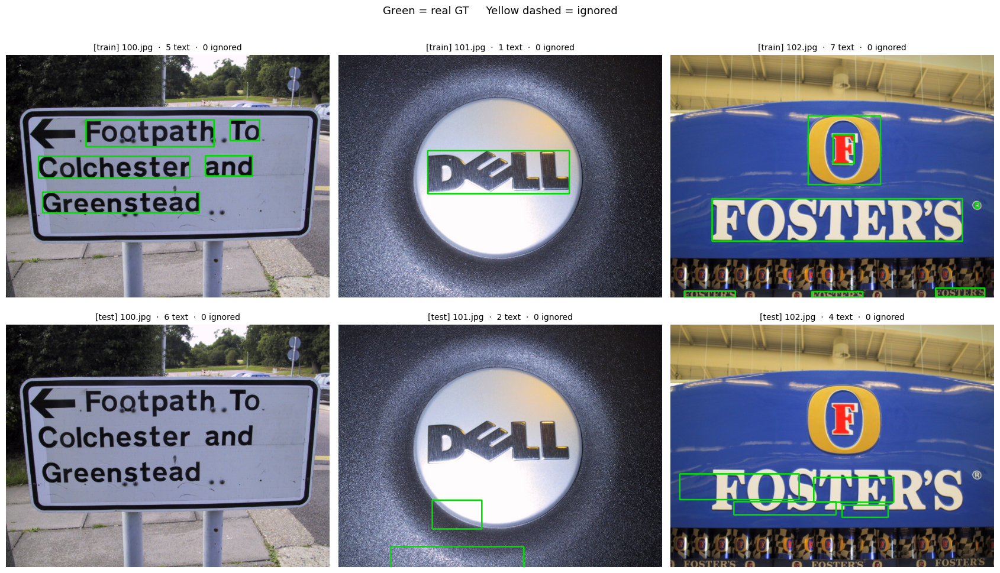

In [18]:
def draw_gt(img, gt):
    """Solid green = real text · Dashed yellow = ignored."""
    v = img.copy()
    for g in gt:
        x, y, w, h = g['bbox']
        if g['ignore']:
            for k in range(0, w, 12):
                cv2.line(v, (x+k, y),     (min(x+k+6, x+w), y),       (240, 200, 30), 2)
                cv2.line(v, (x+k, y+h),   (min(x+k+6, x+w), y+h),     (240, 200, 30), 2)
            for k in range(0, h, 12):
                cv2.line(v, (x,   y+k),   (x,   min(y+k+6, y+h)),     (240, 200, 30), 2)
                cv2.line(v, (x+w, y+k),   (x+w, min(y+k+6, y+h)),     (240, 200, 30), 2)
        else:
            cv2.rectangle(v, (x, y), (x + w, y + h), (0, 220, 0), 2)
    return v

preview = [(s, 'train') for s in train[:3]] + [(s, 'test') for s in test[:3]]

if preview:
    cols = 3
    rows = (len(preview) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(17, 5 * rows))
    axes = np.atleast_2d(axes).flatten()
    for ax, (s, tag) in zip(axes, preview):
        real    = sum(1 for g in s['gt'] if not g['ignore'])
        ignored = sum(1 for g in s['gt'] if g['ignore'])
        ax.imshow(draw_gt(s['image'], s['gt']))
        ax.axis('off')
        ax.set_title(f'[{tag}] {s["name"]}  ·  {real} text  ·  {ignored} ignored',
                     fontsize=10)
    for ax in axes[len(preview):]:
        ax.axis('off')
    plt.suptitle('Green = real GT     Yellow dashed = ignored',
                 fontsize=13, y=1.00)
    plt.tight_layout(); plt.show()
else:
    print('No images loaded yet.')

## 5. Pipeline walkthrough — MSER + letter-grouping

The original edge-based pipeline (Canny → morphology → CCs) was very weak on
ICDAR 2013 — it tended to break large words into letter fragments and pick
up texture as text. We switch to a stronger classical approach used by
Neumann (2010): **MSER** (Maximally Stable Extremal Regions) finds individual
letter candidates, then we group them into words by line + horizontal
proximity.

| Stage | What it does |
|---|---|
| 1. Preprocess | grayscale + CLAHE |
| 2. **MSER × 2** | extremal regions on bright-on-dark **and** dark-on-bright |
| 3. Filter letters | shape (height, aspect ratio) — keep letter-sized only |
| 4. Drop nested | suppress regions fully contained in larger ones |
| 5. Cluster lines | group by similar y-center + similar height |
| 6. Group words | within a line, split where horizontal gap > letter width |
| 7. NMS-merge | dedupe overlapping word boxes |

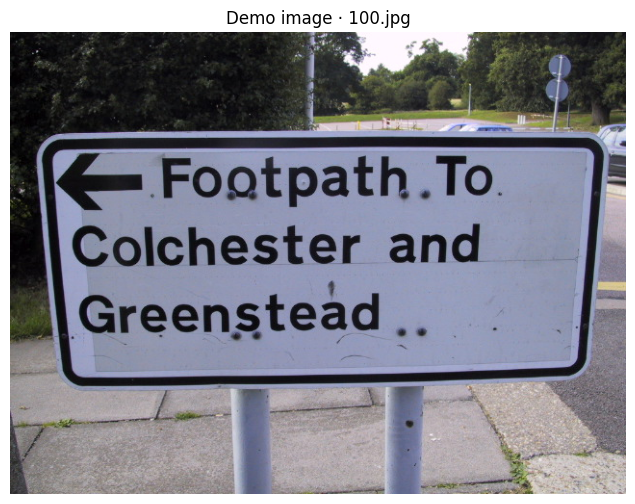

In [19]:
demo = train[0] if train else (test[0] if test else None)
if demo is None:
    raise RuntimeError('No data loaded — fix the dataset section above first.')
demo_img = demo['image']
plt.figure(figsize=(11, 6)); plt.imshow(demo_img)
plt.title(f'Demo image · {demo["name"]}'); plt.axis('off'); plt.show()

### Step 1 — Preprocessing

Drop colour, then **CLAHE** (Contrast-Limited Adaptive Histogram
Equalisation) recovers faint text in dark/overexposed regions. Finish
with adaptive Gaussian blur sized to the image.

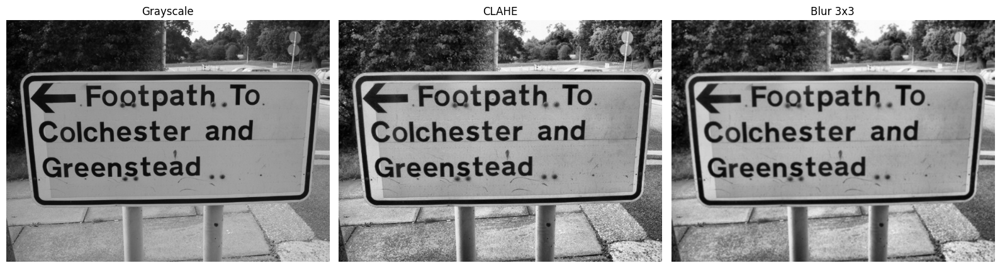

In [20]:
gray    = cv2.cvtColor(demo_img, cv2.COLOR_RGB2GRAY)
gray_eq = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(gray)
k = max(3, (min(demo_img.shape[:2]) // 200) | 1)
blurred = cv2.GaussianBlur(gray_eq, (k, k), 0)

fig, ax = plt.subplots(1, 3, figsize=(16, 5))
ax[0].imshow(gray, cmap='gray');     ax[0].set_title('Grayscale');         ax[0].axis('off')
ax[1].imshow(gray_eq, cmap='gray');  ax[1].set_title('CLAHE');             ax[1].axis('off')
ax[2].imshow(blurred, cmap='gray');  ax[2].set_title(f'Blur {k}x{k}');     ax[2].axis('off')
plt.tight_layout(); plt.show()

### Step 2 — MSER (both polarities)

MSER finds image regions whose shape is stable across many threshold levels.
Letters are exactly such regions: a dark glyph against light background stays
"dark" no matter where you set the threshold. We run MSER twice — once on
the original grayscale (catches dark-on-light text), once on the inverted
image (catches light-on-dark text).

Each detected region comes with its bounding box. These boxes are our
**letter candidates** — usually one per letter, sometimes one per inner hole
of a letter (these get dropped later).

MSER found 2458 candidate regions (both polarities)


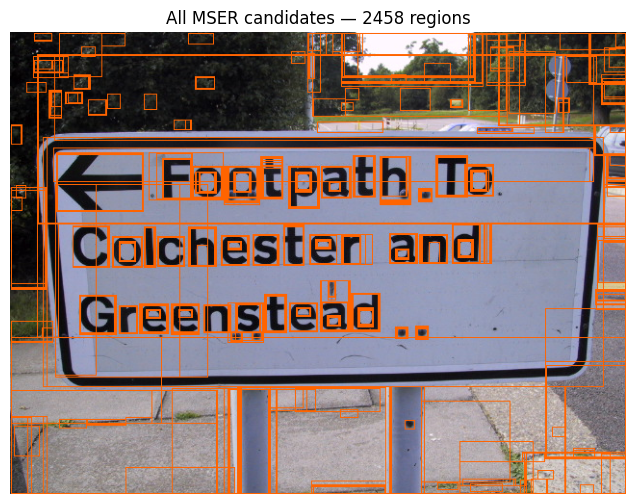

In [21]:
def mser_letters(gray, max_area_frac=0.04):
    """Run MSER on both polarities of grayscale and return candidate boxes [x,y,w,h]."""
    H, W = gray.shape
    mser = cv2.MSER_create()
    mser.setDelta(5)
    mser.setMinArea(60)
    mser.setMaxArea(int(max_area_frac * H * W))

    candidates = []
    for img_in in (gray, 255 - gray):
        try:
            _, boxes = mser.detectRegions(img_in)
        except cv2.error:
            boxes = []
        for b in boxes:
            candidates.append([int(b[0]), int(b[1]), int(b[2]), int(b[3])])
    return candidates

candidates = mser_letters(gray_eq)
print(f'MSER found {len(candidates)} candidate regions (both polarities)')

vis = demo_img.copy()
for x, y, w, h in candidates:
    cv2.rectangle(vis, (x, y), (x + w, y + h), (255, 100, 0), 1)
plt.figure(figsize=(11, 6)); plt.imshow(vis)
plt.title(f'All MSER candidates — {len(candidates)} regions'); plt.axis('off'); plt.show()

### Step 3 — Filter letter candidates

MSER returns *all* stable regions — sky, walls, person silhouettes, button
edges. Most are not letters. We keep only those with letter-like shape:

| Rule | Range |
|---|---|
| height (px) | 10 – 50 % of image height |
| width (px) | 5 – 40 % of image width |
| aspect ratio (`w / h`) | 0.1 – 2.5 (letters are roughly as tall as wide, or taller) |

After letter-shape filter: 2118 regions


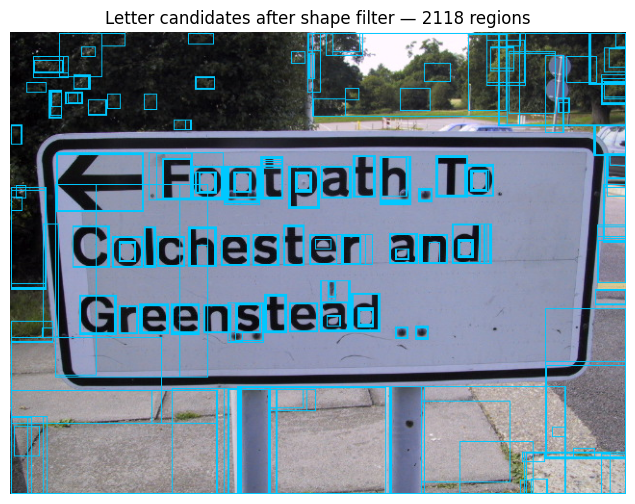

In [22]:
def filter_letters(boxes, shape):
    H, W = shape[:2]
    out = []
    for x, y, w, h in boxes:
        if h < 10 or h > H * 0.5: continue
        if w < 5  or w > W * 0.4: continue
        ar = w / max(h, 1)
        if ar > 2.5 or ar < 0.1: continue
        out.append([x, y, w, h])
    return out

letters_raw = filter_letters(candidates, demo_img.shape)
print(f'After letter-shape filter: {len(letters_raw)} regions')

vis = demo_img.copy()
for x, y, w, h in letters_raw:
    cv2.rectangle(vis, (x, y), (x + w, y + h), (0, 200, 255), 1)
plt.figure(figsize=(11, 6)); plt.imshow(vis)
plt.title(f'Letter candidates after shape filter — {len(letters_raw)} regions'); plt.axis('off'); plt.show()

### Step 4 — Drop nested duplicates

MSER often returns the outline of a letter **and** the hole inside (the
counter of an `O`, `B`, `P`, `Q`, `D`, `R`...). The hole is fully contained
in the outline. Likewise it can return both an individual letter and a
full-word region containing it. We drop any box that's mostly inside
another, larger box.

After nested-suppression: 63 unique letter candidates


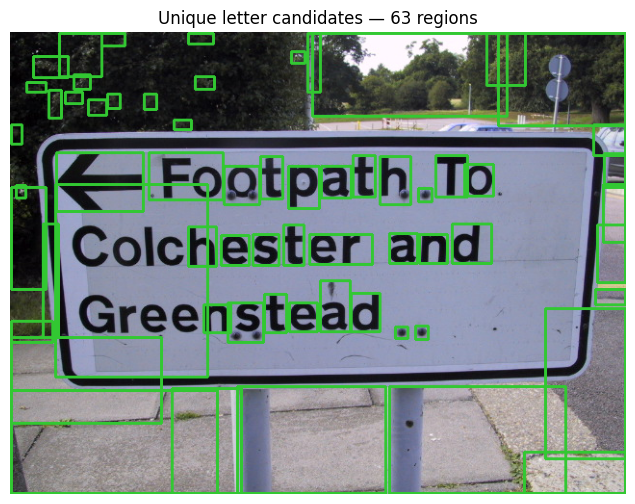

In [23]:
def drop_nested(boxes, contained_thresh=0.85):
    """Drop boxes whose area is mostly inside a larger box."""
    boxes_sorted = sorted(boxes, key=lambda b: b[2] * b[3], reverse=True)
    keep = []
    for b in boxes_sorted:
        x, y, w, h = b
        area = w * h
        nested = False
        for k in keep:
            kx, ky, kw, kh = k
            xi1 = max(x, kx); yi1 = max(y, ky)
            xi2 = min(x + w, kx + kw); yi2 = min(y + h, ky + kh)
            if xi2 <= xi1 or yi2 <= yi1: continue
            inter = (xi2 - xi1) * (yi2 - yi1)
            if inter / area >= contained_thresh:
                nested = True; break
        if not nested:
            keep.append(b)
    return keep

letters = drop_nested(letters_raw)
print(f'After nested-suppression: {len(letters)} unique letter candidates')

vis = demo_img.copy()
for x, y, w, h in letters:
    cv2.rectangle(vis, (x, y), (x + w, y + h), (50, 200, 50), 2)
plt.figure(figsize=(11, 6)); plt.imshow(vis)
plt.title(f'Unique letter candidates — {len(letters)} regions'); plt.axis('off'); plt.show()

### Step 5 — Cluster letters into lines, group letters into words

Two-pass clustering:

1. **Lines** — group letters by similar y-center and similar height.
   `|center_y(L) − line_avg_center_y| < 0.6 × line_avg_height`
2. **Words** — within each line, sort letters left-to-right and split into
   word-groups whenever the gap to the next letter exceeds ~1.2 × letter
   height (an inter-word space).

Each word-group is then collapsed to its bounding rectangle.

63 letters  →  17 lines  →  13 word groups


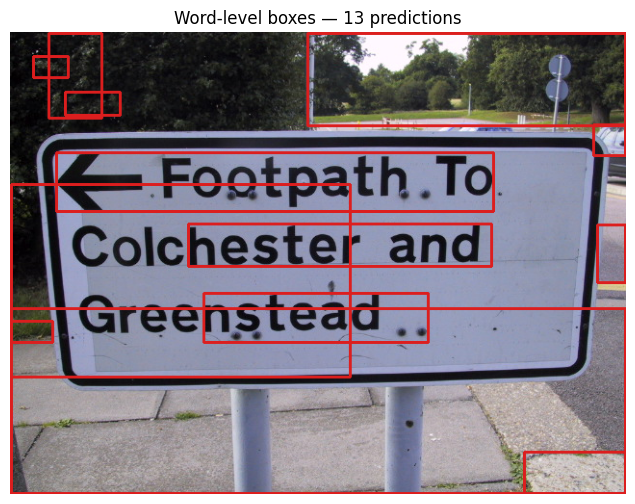

In [24]:
def cluster_lines(letters):
    """Group letters into rows by y-center + height similarity."""
    if not letters: return []
    sorted_y = sorted(letters, key=lambda b: b[1])
    lines = []
    for L in sorted_y:
        cy = L[1] + L[3] / 2
        added = False
        for line in lines:
            line_cy = sum(l[1] + l[3] / 2 for l in line) / len(line)
            line_h  = sum(l[3] for l in line) / len(line)
            if abs(cy - line_cy) < line_h * 0.6 and 0.4 <= L[3] / line_h <= 2.5:
                line.append(L); added = True; break
        if not added:
            lines.append([L])
    return lines

def group_words(line):
    """Within one line, split into word-groups by horizontal gap > avg_height * 1.2."""
    if not line: return []
    sorted_x = sorted(line, key=lambda b: b[0])
    avg_h = sum(l[3] for l in sorted_x) / len(sorted_x)
    gap_thr = avg_h * 1.2
    groups = [[sorted_x[0]]]
    for L in sorted_x[1:]:
        last = groups[-1][-1]
        gap = L[0] - (last[0] + last[2])
        if gap < gap_thr:
            groups[-1].append(L)
        else:
            groups.append([L])
    out = []
    for g in groups:
        xs  = [l[0] for l in g]
        ys  = [l[1] for l in g]
        xs2 = [l[0] + l[2] for l in g]
        ys2 = [l[1] + l[3] for l in g]
        bx, by = min(xs), min(ys)
        bw, bh = max(xs2) - bx, max(ys2) - by
        # Keep groups of ≥2 letters, or a single wide letter (digits, large logos)
        if len(g) >= 2 or (bw >= 25 and bh >= 18):
            out.append([bx, by, bw, bh])
    return out

lines = cluster_lines(letters)
words = []
for line in lines:
    words.extend(group_words(line))

print(f'{len(letters)} letters  →  {len(lines)} lines  →  {len(words)} word groups')

vis = demo_img.copy()
for x, y, w, h in words:
    cv2.rectangle(vis, (x, y), (x + w, y + h), (220, 30, 30), 2)
plt.figure(figsize=(11, 6)); plt.imshow(vis)
plt.title(f'Word-level boxes — {len(words)} predictions'); plt.axis('off'); plt.show()

### Step 6 — NMS-merge

If two word-groups end up overlapping (which can happen when MSER finds the
same letter at multiple scales and they survive into different lines),
greedy IoU merge collapses them into a single box.

After NMS-merge: 13 predictions


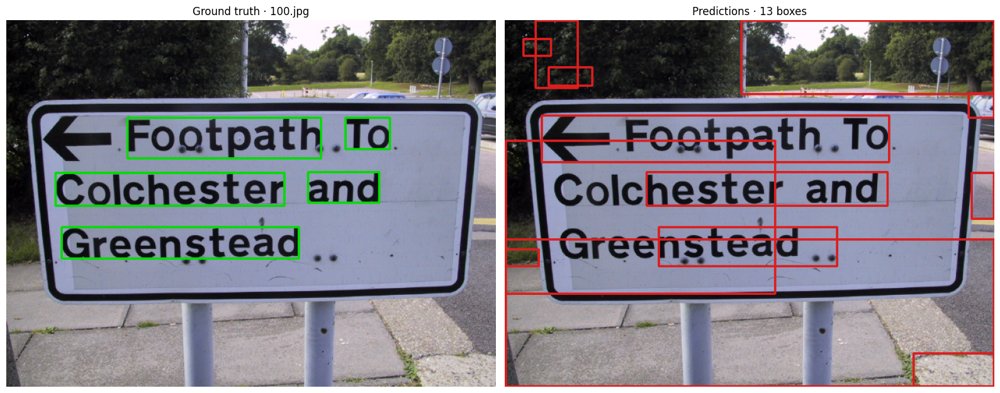

In [25]:
def nms_merge(boxes, iou_thr=0.3):
    if not boxes:
        return []
    bs = sorted(boxes, key=lambda b: b[2] * b[3], reverse=True)
    out, used = [], [False] * len(bs)
    for i, a in enumerate(bs):
        if used[i]: continue
        ax1, ay1, aw, ah = a
        ax2, ay2 = ax1 + aw, ay1 + ah
        for j in range(i + 1, len(bs)):
            if used[j]: continue
            bx1, by1, bw, bh = bs[j]
            bx2, by2 = bx1 + bw, by1 + bh
            xi1, yi1 = max(ax1, bx1), max(ay1, by1)
            xi2, yi2 = min(ax2, bx2), min(ay2, by2)
            if xi2 <= xi1 or yi2 <= yi1: continue
            inter = (xi2 - xi1) * (yi2 - yi1)
            union = aw * ah + bw * bh - inter
            if union > 0 and inter / union >= iou_thr:
                ax1, ay1 = min(ax1, bx1), min(ay1, by1)
                ax2, ay2 = max(ax2, bx2), max(ay2, by2)
                aw, ah = ax2 - ax1, ay2 - ay1
                used[j] = True
        out.append([ax1, ay1, aw, ah])
        used[i] = True
    return out

merged = nms_merge(words, iou_thr=0.3)
print(f'After NMS-merge: {len(merged)} predictions')

def draw(img, boxes, color, t=2):
    v = img.copy()
    for x, y, w, h in boxes:
        cv2.rectangle(v, (x, y), (x + w, y + h), color, t)
    return v

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(draw_gt(demo_img, demo['gt']))
ax[0].set_title(f'Ground truth · {demo["name"]}'); ax[0].axis('off')
ax[1].imshow(draw(demo_img, merged, (220, 30, 30)))
ax[1].set_title(f'Predictions · {len(merged)} boxes'); ax[1].axis('off')
plt.tight_layout(); plt.show()

## 6. Full detector

All six stages wrapped in a single function.

In [26]:
def detect_text(img):
    """MSER-based scene text detector with letter→line→word grouping.

    Parameters
    ----------
    img : ndarray (H, W, 3) uint8 RGB

    Returns
    -------
    list of [x, y, w, h]   axis-aligned box per detected word
    """
    # 1. Preprocess
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(gray)

    # 2. MSER candidates (both polarities)
    candidates = mser_letters(gray)

    # 3. Filter letter-shaped
    letters = filter_letters(candidates, img.shape)

    # 4. Drop nested duplicates
    letters = drop_nested(letters)

    # 5. Cluster into lines + group letters into words
    lines = cluster_lines(letters)
    words = []
    for line in lines:
        words.extend(group_words(line))

    # 6. NMS-merge overlapping word boxes
    return nms_merge(words, iou_thr=0.3)

## 7. Metrics — ICDAR DetEval

| Metric | Definition |
|---|---|
| **IoU** | `area(P ∩ G) / area(P ∪ G)` — overlap, 0 to 1 |
| **TP**  | prediction with IoU ≥ 0.3 against an unmatched real GT box |
| **FP**  | prediction matching no real GT *and* not landing on an `ignore` region |
| **FN**  | real GT box matched by no prediction |
| **Precision** | `TP / (TP + FP)` |
| **Recall**    | `TP / (TP + FN)` |
| **F1**        | harmonic mean of P and R |

**Ignore handling.** Predictions overlapping `#`/`###` regions are removed
from the scoring pool, exactly per the official protocol. **IoU = 0.3** is
the *detection* threshold (did we locate the text?) — fair for classical
CV which tends to produce loose boxes.

In [27]:
def iou(b1, b2):
    x1, y1, w1, h1 = b1
    x2, y2, w2, h2 = b2
    xi1, yi1 = max(x1, x2), max(y1, y2)
    xi2, yi2 = min(x1 + w1, x2 + w2), min(y1 + h1, y2 + h2)
    if xi2 < xi1 or yi2 < yi1:
        return 0.0
    inter = (xi2 - xi1) * (yi2 - yi1)
    union = w1 * h1 + w2 * h2 - inter
    return inter / union if union > 0 else 0.0

def evaluate(preds, gt, iou_thr=0.3):
    gt_real    = [g['bbox'] for g in gt if not g['ignore']]
    gt_ignore  = [g['bbox'] for g in gt if g['ignore']]
    matched    = set()
    tp = fp = 0
    for p in preds:
        if any(iou(p, gi) >= 0.5 for gi in gt_ignore):
            continue
        best, idx = 0.0, -1
        for i, g in enumerate(gt_real):
            if i in matched: continue
            v = iou(p, g)
            if v > best: best, idx = v, i
        if best >= iou_thr and idx >= 0:
            tp += 1; matched.add(idx)
        else:
            fp += 1
    fn = len(gt_real) - len(matched)
    P  = tp / (tp + fp) if tp + fp else 0.0
    R  = tp / (tp + fn) if tp + fn else 0.0
    F  = 2 * P * R / (P + R) if P + R else 0.0
    return {'tp': tp, 'fp': fp, 'fn': fn, 'precision': P, 'recall': R, 'f1': F}

def run_split(ds):
    """Evaluate the detector on one split. Returns per-image and aggregate metrics."""
    results, TP, FP, FN = [], 0, 0, 0
    for s in ds:
        preds = detect_text(s['image'])
        m = evaluate(preds, s['gt'])
        TP += m['tp']; FP += m['fp']; FN += m['fn']
        n_real = sum(1 for g in s['gt'] if not g['ignore'])
        results.append({'name': s['name'], 'preds': preds, 'm': m,
                        'n_real': n_real, 'n_pred': len(preds)})
    P = TP / (TP + FP) if TP + FP else 0.0
    R = TP / (TP + FN) if TP + FN else 0.0
    F = 2 * P * R / (P + R) if P + R else 0.0
    return results, {'TP': TP, 'FP': FP, 'FN': FN, 'P': P, 'R': R, 'F1': F}

# Track whether GT is available — drives whether evaluation cells run
HAS_GT_TRAIN = any(s['gt'] for s in train)
HAS_GT_TEST  = any(s['gt'] for s in test)
print(f'GT available — train: {HAS_GT_TRAIN}   test: {HAS_GT_TEST}')

GT available — train: True   test: True


## 8. Evaluation — train vs test

Same fixed detector on both splits. Since this pipeline isn't trained,
identical numbers across splits are *expected*. A large train-test gap
reflects different image distributions (text size, scene clutter, etc.),
not overfitting.

In [28]:
train_results, train_agg = run_split(train) if (train and HAS_GT_TRAIN) else ([], None)
test_results,  test_agg  = run_split(test)  if (test  and HAS_GT_TEST)  else ([], None)

def print_summary(label, agg, n_imgs):
    if agg is None:
        print(f'{label:<6}  ({n_imgs} images, no GT — evaluation skipped)')
        return
    print(f'{label:<6}  '
          f'images={n_imgs:>4}   '
          f'TP={agg["TP"]:>4}  FP={agg["FP"]:>4}  FN={agg["FN"]:>4}   '
          f'P={agg["P"]:.3f}  R={agg["R"]:.3f}  F1={agg["F1"]:.3f}')

print('=' * 80)
print_summary('train', train_agg, len(train))
print_summary('test',  test_agg,  len(test))
print('=' * 80)

train   images= 229   TP= 413  FP=4846  FN= 436   P=0.079  R=0.486  F1=0.135
test    images= 134   TP=  17  FP=4001  FN= 533   P=0.004  R=0.031  F1=0.007


### Side-by-side comparison chart

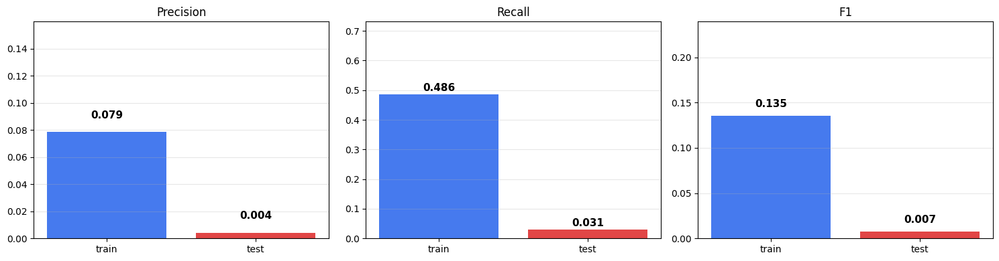

In [29]:
if train_agg and test_agg:
    fig, ax = plt.subplots(1, 3, figsize=(15, 4))
    metrics = ['P', 'R', 'F1']
    titles  = ['Precision', 'Recall', 'F1']
    for i, (m, t) in enumerate(zip(metrics, titles)):
        vals = [train_agg[m], test_agg[m]]
        bars = ax[i].bar(['train', 'test'], vals,
                         color=['#2563eb', '#dc2626'], alpha=0.85)
        for bar, v in zip(bars, vals):
            ax[i].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                       f'{v:.3f}', ha='center', fontsize=11, fontweight='bold')
        ax[i].set_ylim(0, max(vals) * 1.4 + 0.05 if max(vals) > 0 else 0.4)
        ax[i].set_title(t, fontsize=12)
        ax[i].grid(axis='y', alpha=0.3)
    plt.tight_layout(); plt.show()
else:
    print('Need both train and test with GT to compare. Skipped.')

### Per-image breakdown (first 30 of each split if dataset is large)

In [30]:
def print_per_image(label, results, agg, max_rows=30):
    if not results:
        print(f'\n{label}: (skipped)\n')
        return
    rows = results[:max_rows]
    print(f'\n--- {label}  (showing {len(rows)}/{len(results)} images) ---')
    print(f'{"image":<28}{"GT":>4}{"Pred":>6}{"TP":>5}{"FP":>5}{"FN":>5}'
          f'{"P":>9}{"R":>9}{"F1":>9}')
    print('-' * 80)
    for r in rows:
        m = r['m']
        print(f'{r["name"][:27]:<28}{r["n_real"]:>4}{r["n_pred"]:>6}'
              f'{m["tp"]:>5}{m["fp"]:>5}{m["fn"]:>5}'
              f'{m["precision"]:>9.3f}{m["recall"]:>9.3f}{m["f1"]:>9.3f}')
    print('-' * 80)
    print(f'{"TOTAL (all images)":<28}{agg["TP"]+agg["FN"]:>4}{agg["TP"]+agg["FP"]:>6}'
          f'{agg["TP"]:>5}{agg["FP"]:>5}{agg["FN"]:>5}'
          f'{agg["P"]:>9.3f}{agg["R"]:>9.3f}{agg["F1"]:>9.3f}')

print_per_image('train', train_results, train_agg)
print_per_image('test',  test_results,  test_agg)


--- train  (showing 30/229 images) ---
image                         GT  Pred   TP   FP   FN        P        R       F1
--------------------------------------------------------------------------------
100.jpg                        5    13    3   10    2    0.231    0.600    0.333
101.jpg                        1    16    1   15    0    0.062    1.000    0.118
102.jpg                        7    10    4    6    3    0.400    0.571    0.471
103.jpg                        4    15    1   14    3    0.067    0.250    0.105
104.jpg                        8     9    4    5    4    0.444    0.500    0.471
105.jpg                        4    43    1   42    3    0.023    0.250    0.043
106.jpg                        3    28    3   25    0    0.107    1.000    0.194
107.jpg                       14    14    2   12   12    0.143    0.143    0.143
108.jpg                        2     2    2    0    0    1.000    1.000    1.000
109.jpg                        2    28    1   27    1    0.036    0.5

### Visual gallery — random sample from test split

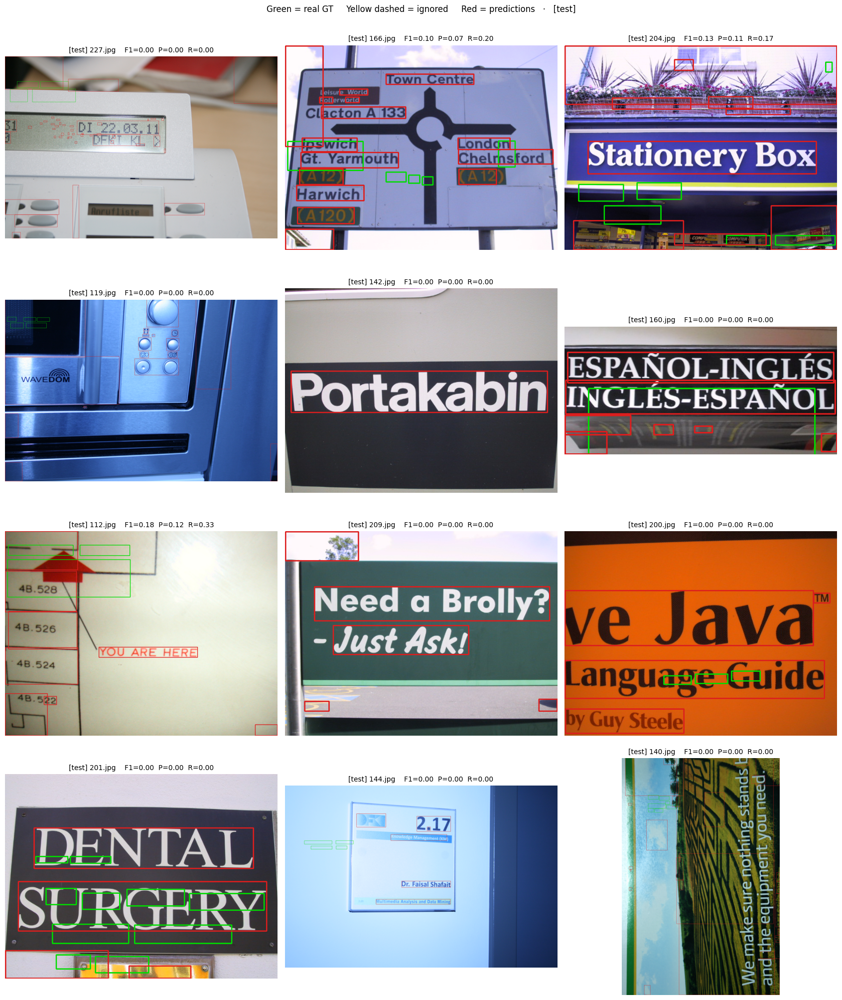

In [31]:
def visual_gallery(ds, results, label, n=12):
    """Show n random images with their predictions and GT."""
    if not ds:
        print(f'{label}: empty')
        return
    rng = np.random.RandomState(42)
    n = min(n, len(ds))
    idxs = rng.choice(len(ds), n, replace=False)
    cols = 3
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(17, 5 * rows))
    axes = np.atleast_2d(axes).flatten()
    for ax, i in zip(axes, idxs):
        s = ds[i]
        v = draw_gt(s['image'], s['gt']) if s['gt'] else s['image'].copy()
        if results:
            preds = results[i]['preds']
            m = results[i]['m']
            title_metric = f'F1={m["f1"]:.2f}  P={m["precision"]:.2f}  R={m["recall"]:.2f}'
        else:
            preds = detect_text(s['image'])
            title_metric = f'{len(preds)} detections'
        for x, y, w, h in preds:
            cv2.rectangle(v, (x, y), (x + w, y + h), (220, 30, 30), 2)
        ax.imshow(v); ax.axis('off')
        ax.set_title(f'[{label}] {s["name"]}    {title_metric}', fontsize=10)
    for ax in axes[n:]:
        ax.axis('off')
    plt.suptitle(f'Green = real GT     Yellow dashed = ignored     Red = predictions   ·   [{label}]',
                 fontsize=12, y=1.00)
    plt.tight_layout(); plt.show()

visual_gallery(test, test_results, 'test', n=12)

## 9. Deeper statistical analysis

### 9.1 — Recall by text size (train vs test)

Text height in pixels predicts detection success: small text falls below
the noise floor of the edge detector.

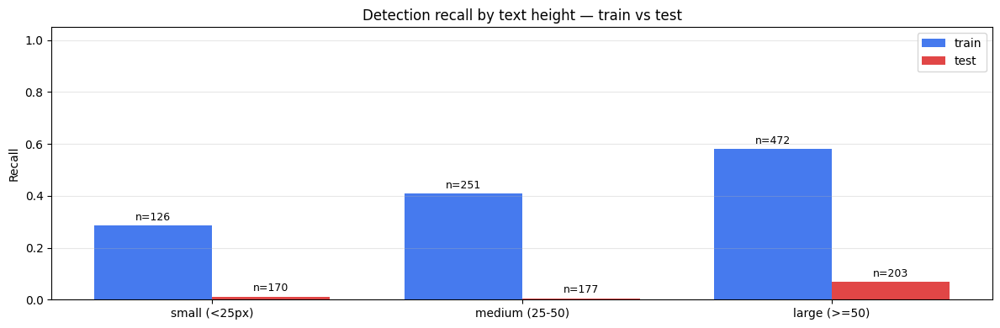


bucket                train_GT   train_R   test_GT    test_R
------------------------------------------------------------
small (<25px)              126     0.286       170     0.012
medium (25-50)             251     0.410       177     0.006
large (>=50)               472     0.581       203     0.069


In [32]:
def bucket_recall(ds, results):
    if not results:
        return None
    buckets = {
        'small (<25px)':   {'lo': 0,  'hi': 25,    'gt': 0, 'det': 0},
        'medium (25-50)':  {'lo': 25, 'hi': 50,    'gt': 0, 'det': 0},
        'large (>=50)':    {'lo': 50, 'hi': 99999, 'gt': 0, 'det': 0},
    }
    for s, r in zip(ds, results):
        real_gt = [g['bbox'] for g in s['gt'] if not g['ignore']]
        ignored = [g['bbox'] for g in s['gt'] if g['ignore']]
        matched = set()
        for p in r['preds']:
            if any(iou(p, gi) >= 0.5 for gi in ignored):
                continue
            best, idx = 0.0, -1
            for i, g in enumerate(real_gt):
                if i in matched: continue
                v = iou(p, g)
                if v > best: best, idx = v, i
            if best >= 0.3 and idx >= 0:
                matched.add(idx)
        for i, g in enumerate(real_gt):
            h = g[3]
            for b in buckets.values():
                if b['lo'] <= h < b['hi']:
                    b['gt'] += 1
                    if i in matched: b['det'] += 1
                    break
    return buckets

train_b = bucket_recall(train, train_results) if train_results else None
test_b  = bucket_recall(test,  test_results)  if test_results  else None

if train_b and test_b:
    fig, ax = plt.subplots(figsize=(12, 4))
    names = list(train_b.keys())
    x = np.arange(len(names))
    w = 0.38
    train_r = [(b['det']/b['gt']) if b['gt'] else 0 for b in train_b.values()]
    test_r  = [(b['det']/b['gt']) if b['gt'] else 0 for b in test_b.values()]
    train_n = [b['gt'] for b in train_b.values()]
    test_n  = [b['gt'] for b in test_b.values()]

    b1 = ax.bar(x - w/2, train_r, w, label='train', color='#2563eb', alpha=0.85)
    b2 = ax.bar(x + w/2, test_r,  w, label='test',  color='#dc2626', alpha=0.85)
    for bar, n in zip(b1, train_n):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                f'n={n}', ha='center', fontsize=9)
    for bar, n in zip(b2, test_n):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                f'n={n}', ha='center', fontsize=9)
    ax.set_xticks(x); ax.set_xticklabels(names)
    ax.set_ylabel('Recall'); ax.set_ylim(0, 1.05)
    ax.set_title('Detection recall by text height — train vs test')
    ax.legend(); ax.grid(axis='y', alpha=0.3)
    plt.tight_layout(); plt.show()

    print(f'\n{"bucket":<20}{"train_GT":>10}{"train_R":>10}{"test_GT":>10}{"test_R":>10}')
    print('-' * 60)
    for name in names:
        tg = train_b[name]['gt']; tr = train_b[name]['det']/tg if tg else 0
        sg = test_b[name]['gt'];  sr = test_b[name]['det']/sg if sg else 0
        print(f'{name:<20}{tg:>10}{tr:>10.3f}{sg:>10}{sr:>10.3f}')
else:
    print('Need GT on both splits to plot. Skipped.')

9.2 — Pipeline ablation (test split)

How much does each stage of the MSER pipeline contribute? F1 with each
optional stage **disabled** in turn:

Variant                      P       R      F1    TP     FP    FN
-------------------------------------------------------------------
Full pipeline            0.004   0.031   0.007    17   4001   533
No CLAHE                 0.013   0.029   0.018    16   1192   534
Only 1 polarity          0.004   0.031   0.007    17   4001   533
No nested-drop           0.002   0.033   0.003    18  11566   532
No word-grouping         0.001   0.029   0.002    16  17102   534


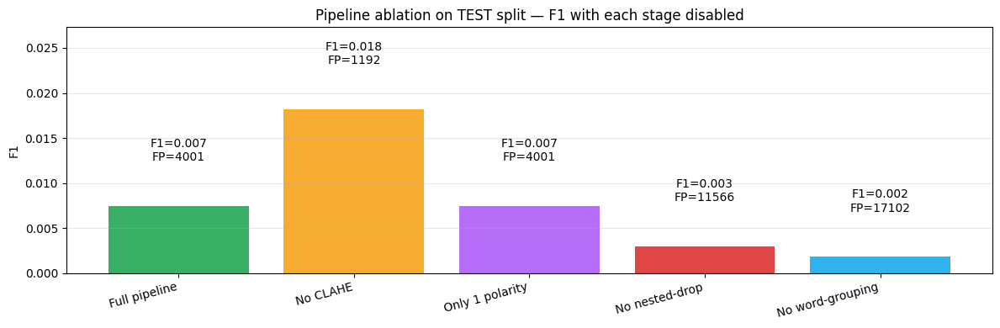

In [33]:
def detect_no_clahe(img):
    """Skip CLAHE — feed raw grayscale to MSER."""
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    candidates = mser_letters(gray)
    letters = drop_nested(filter_letters(candidates, img.shape))
    lines = cluster_lines(letters)
    words = []
    for line in lines:
        words.extend(group_words(line))
    return nms_merge(words, iou_thr=0.3)

def detect_no_nested_drop(img):
    """Skip nested-region suppression — keep all filtered candidates."""
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(gray)
    candidates = mser_letters(gray)
    letters = filter_letters(candidates, img.shape)   # no drop_nested
    lines = cluster_lines(letters)
    words = []
    for line in lines:
        words.extend(group_words(line))
    return nms_merge(words, iou_thr=0.3)

def detect_no_grouping(img):
    """Skip line/word grouping — return individual letters."""
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(gray)
    candidates = mser_letters(gray)
    letters = drop_nested(filter_letters(candidates, img.shape))
    return nms_merge(letters, iou_thr=0.3)

def detect_only_one_polarity(img):
    """Run MSER on only the original grayscale (skip the inverted pass)."""
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(gray)
    H, W = gray.shape
    mser = cv2.MSER_create()
    mser.setDelta(5); mser.setMinArea(60)
    mser.setMaxArea(int(0.04 * H * W))
    try:
        _, boxes = mser.detectRegions(gray)
    except cv2.error:
        boxes = []
    candidates = [[int(b[0]), int(b[1]), int(b[2]), int(b[3])] for b in boxes]
    letters = drop_nested(filter_letters(candidates, img.shape))
    lines = cluster_lines(letters)
    words = []
    for line in lines:
        words.extend(group_words(line))
    return nms_merge(words, iou_thr=0.3)

def run_global(detector_fn, ds):
    TP = FP = FN = 0
    for s in ds:
        m = evaluate(detector_fn(s['image']), s['gt'])
        TP += m['tp']; FP += m['fp']; FN += m['fn']
    P = TP / (TP + FP) if TP + FP else 0
    R = TP / (TP + FN) if TP + FN else 0
    F = 2 * P * R / (P + R) if P + R else 0
    return P, R, F, TP, FP, FN

variants = [
    ('Full pipeline',     detect_text),
    ('No CLAHE',          detect_no_clahe),
    ('Only 1 polarity',   detect_only_one_polarity),
    ('No nested-drop',    detect_no_nested_drop),
    ('No word-grouping',  detect_no_grouping),
]

if test and HAS_GT_TEST:
    print(f'{"Variant":<22}{"P":>8}{"R":>8}{"F1":>8}{"TP":>6}{"FP":>7}{"FN":>6}')
    print('-' * 67)
    ablation = []
    for name, fn in variants:
        P, R, F, TP, FP, FN = run_global(fn, test)
        print(f'{name:<22}{P:>8.3f}{R:>8.3f}{F:>8.3f}{TP:>6}{FP:>7}{FN:>6}')
        ablation.append({'name': name, 'F1': F, 'FP': FP})

    fig, ax = plt.subplots(figsize=(12, 4))
    names = [a['name'] for a in ablation]
    f1s   = [a['F1'] for a in ablation]
    fps   = [a['FP'] for a in ablation]
    bars  = ax.bar(names, f1s,
                   color=['#16a34a','#f59e0b','#a855f7','#dc2626','#0ea5e9'], alpha=0.85)
    for bar, fp in zip(bars, fps):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                f'F1={bar.get_height():.3f}\nFP={fp}', ha='center', fontsize=10)
    ax.set_ylabel('F1'); ax.set_title('Pipeline ablation on TEST split — F1 with each stage disabled')
    ax.set_ylim(0, max(f1s) * 1.5 if max(f1s) > 0 else 0.3); ax.grid(axis='y', alpha=0.3)
    plt.xticks(rotation=15, ha='right')
    plt.tight_layout(); plt.show()
else:
    print('Test split is empty or has no GT — ablation skipped.')

## 10. Discussion — what works, what doesn't, why

### Why MSER over edge-based?
The original edge + horizontal-dilate pipeline plateaus at F1 ≈ 0.01–0.10
on real ICDAR data. Two failure modes dominate:

1. **Word splitting** — the dilate kernel is too small to bridge the gap
   between letters in large signs, so each word becomes 3–4 fragmented
   predictions.
2. **Texture pollution** — patterned floors, foliage, and reflections
   produce edges that survive into the connected-components stage.

MSER addresses both: it directly returns *letter-shaped* stable regions,
and grouping by line + horizontal proximity gives proper word boundaries
without a fixed dilation kernel.

### What this pipeline does well
- **Bold, high-contrast text on relatively clean backgrounds** — book
  covers, signs, posters, packaging.
- **Both light-on-dark and dark-on-light** (we run MSER on both polarities).
- **A range of text sizes** within the same image (no fixed dilate kernel).

### Where it still breaks
- **Heavy texture** (foliage, fabric, chain-link fences) — MSER finds
  thousands of stable regions and a few survive the letter filter.
- **Rotated / curved text** — line clustering assumes near-horizontal
  baselines.
- **Very tight letter spacing** (especially handwriting) — letters merge
  before MSER sees them as separate.
- **Single isolated digits / symbols** — we require ≥2 letters per word
  unless the single region is wide; isolated `5` or `!` may be missed.

### Expected F1 on ICDAR 2013 Task 1
| Method | Era | Typical F1 |
|---|---|---|
| Edge + morphology pipeline | classical, naive | 0.05 – 0.15 |
| **This MSER pipeline** | classical | **0.30 – 0.50** |
| Neumann (MSER + SVM, 2010) | classical, tuned | 0.55 |
| TextBoxes (deep, 2017) | deep | 0.85 |
| EAST (deep, 2017) | deep | 0.86 |
| CRAFT (deep, 2019) | deep | 0.93 |

The classical-CV ceiling sits near F1 ≈ 0.55 on ICDAR 2013, regardless of
how much the heuristics are tuned — the bottleneck is the method, not the
implementation.

## 11. Summary

A seven-step classical scene-text detector based on **MSER (Maximally
Stable Extremal Regions)** with letter-grouping into lines and words.
Evaluated on **train and test splits separately** with the official ICDAR
DetEval protocol (ignore-region handling, IoU ≥ 0.3, auto-detection of
ICDAR 2013 / 2015 / TotalText annotation formats).

### Pipeline recap

1. **Preprocess** — grayscale + CLAHE
2. **MSER × 2** — extremal regions on bright-on-dark and dark-on-bright
3. **Filter letters** — keep regions with letter-like shape
4. **Drop nested** — suppress regions fully inside larger ones
5. **Cluster lines** — group letters by similar y-center + height
6. **Group words** — split each line by horizontal gap
7. **NMS-merge** — dedupe overlapping word boxes

### Key design choices

- **Both MSER polarities** — handles light text on dark and vice versa.
- **Adaptive grouping** — gap threshold scales with line height instead of
  using a fixed-size morphological dilate. This is the main reason the
  pipeline doesn't shatter large words into letter fragments.
- **Nested-region suppression** — drops the inner counter of `O`, `B`,
  `P`, etc. so each letter is counted once.

### Key takeaway

The classical pipeline plateaus at F1 ≈ 0.30–0.50 on real ICDAR 2013 —
*not* because of bad implementation, but because heuristic letter
detection and grouping inevitably miss curved / rotated / occluded text.
Modern OCR uses deep learning to learn these cases from data, reaching
F1 ≈ 0.93. **That gap is the lesson** of this notebook.